In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
from warnings import simplefilter

simplefilter(action="ignore")


sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

results_file = "write/fetal_blood.h5ad"

adata = sc.datasets.ebi_expression_atlas("E-MTAB-10042")

adata.var_names_make_unique()

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.26.4 scipy==1.14.0 pandas==2.2.2 scikit-learn==1.5.1 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13


normalizing counts per cell
    finished (0:00:00)


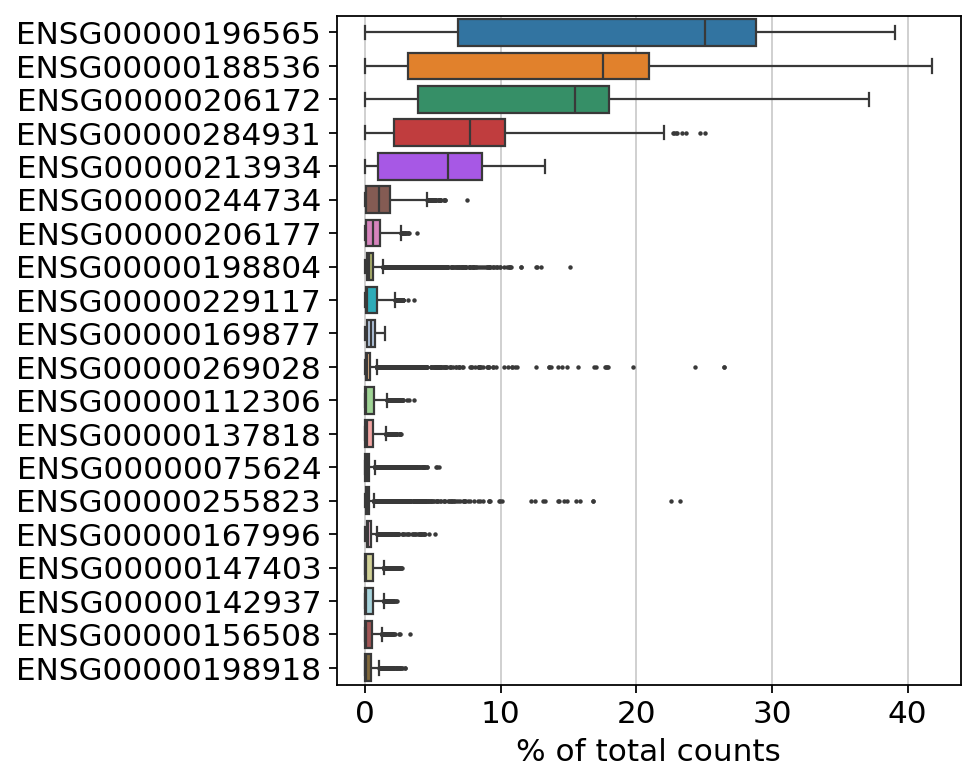

In [2]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [3]:
# filter out the cells with less than 200 genes and
# filter out genes that show up in less than 3 cells
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

adata.var["mt"] = False

bdata = pd.read_csv("mt_genes_table.txt", sep="\t", header=0).get("ensembl")

for a in adata.var_names:
    for b in bdata:
        if a == b:
            adata.var.loc[a, "mt"] = True

sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True)

#for i in range(len(adata.var)):
#    if adata.var.iloc[i]["mt"]:
#        print(i)

filtered out 27 cells that have less than 200 genes expressed


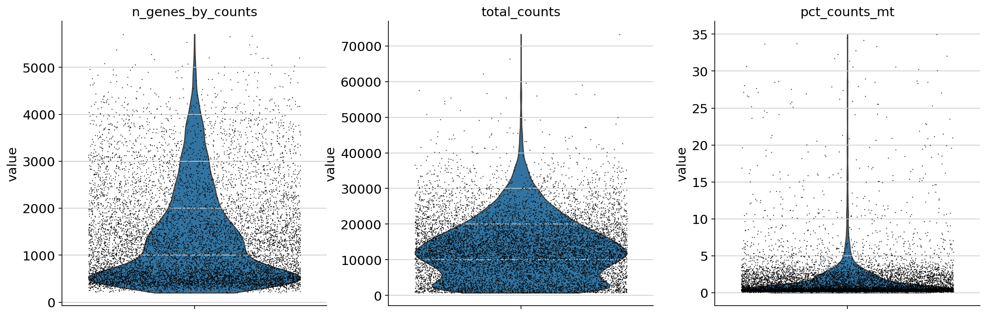

In [4]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

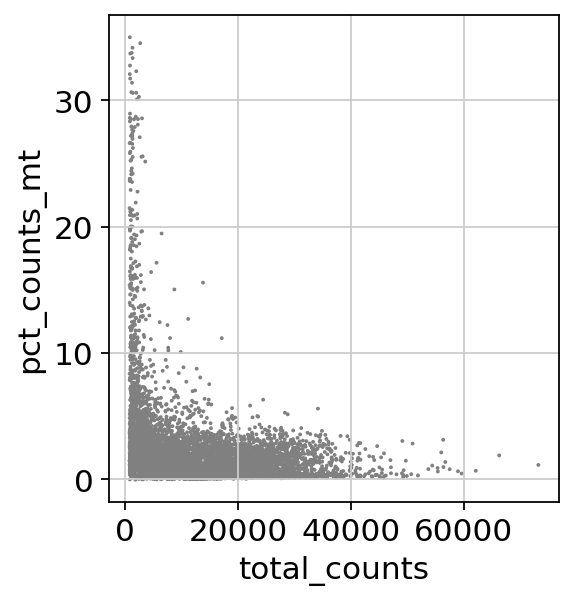

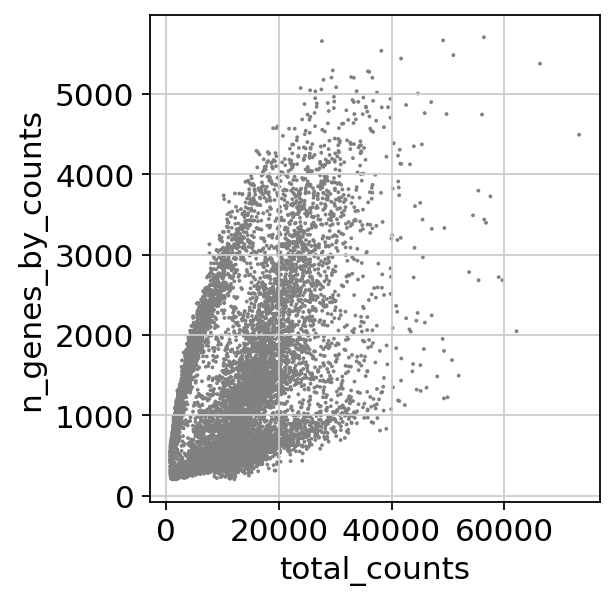

In [5]:
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts")

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


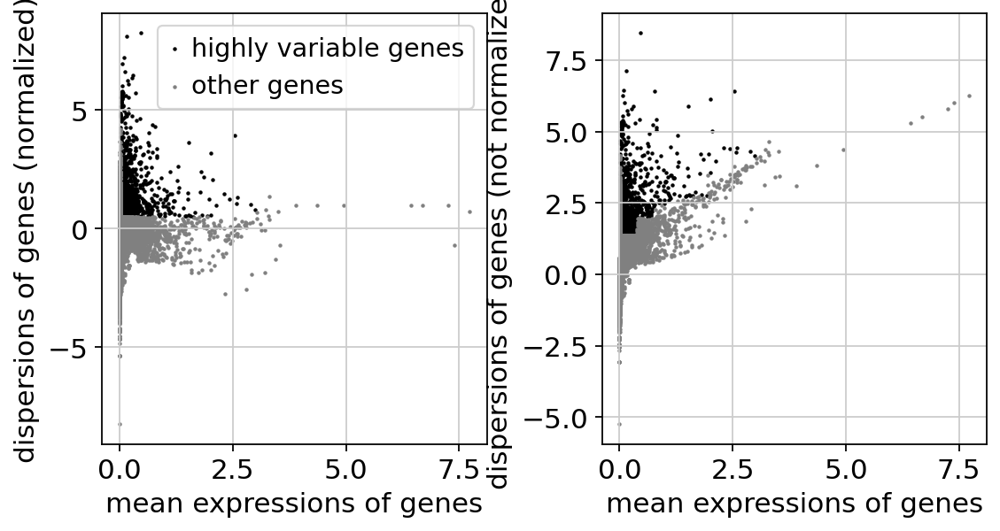

In [6]:
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :].copy()

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

sc.pl.highly_variable_genes(adata)

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:16)
computing PCA
    with n_comps=50
    finished (0:00:04)


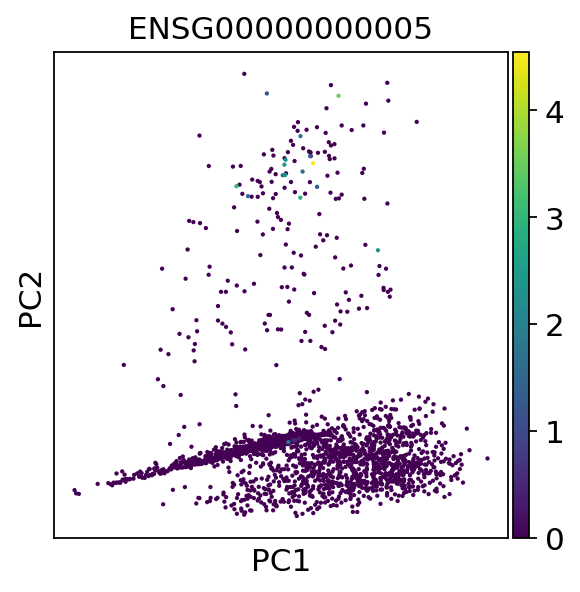

In [7]:
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)

adata.raw = adata
adata = adata[:, adata.var.highly_variable]

sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt"])
sc.pp.scale(adata, max_value=10)

sc.tl.pca(adata, svd_solver="arpack")
sc.pl.pca(adata, color="ENSG00000000005")

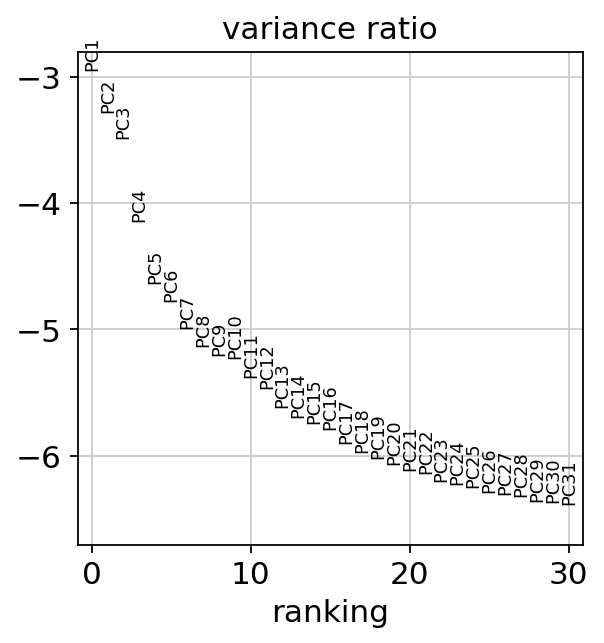

In [8]:
sc.pl.pca_variance_ratio(adata, log=True)

In [9]:
adata.write(results_file)

In [10]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

sc.tl.leiden(
    adata,
    resolution=0.9,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)

sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)
sc.tl.umap(adata, init_pos="paga")

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Leiden clustering
    finished: found 23 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


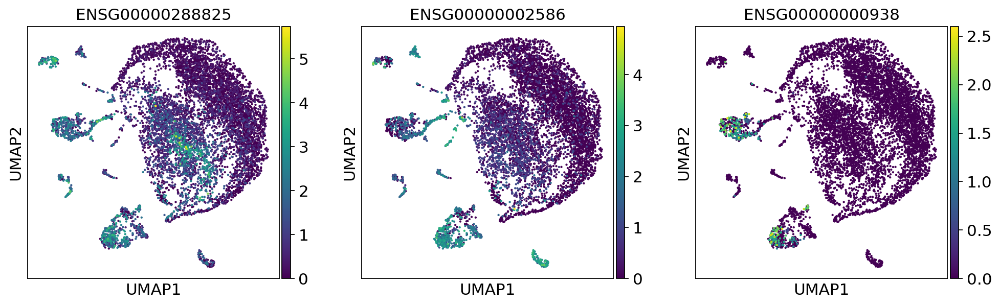

In [11]:
sc.tl.umap(adata)
sc.pl.umap(adata, color=["ENSG00000288825", "ENSG00000002586", "ENSG00000000938"])

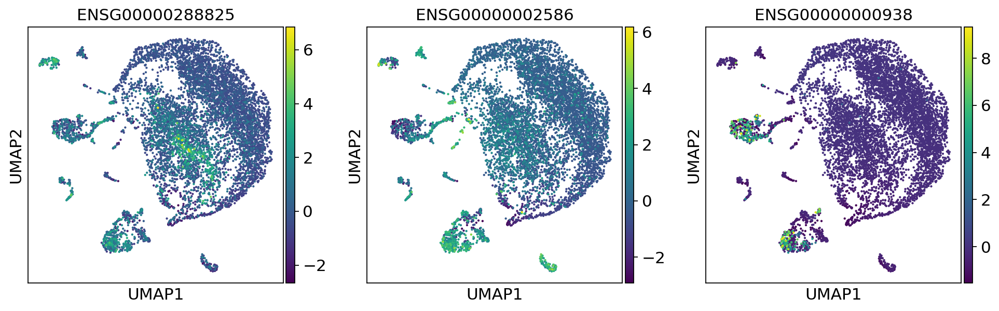

In [12]:
sc.pl.umap(adata, color=["ENSG00000288825", "ENSG00000002586", "ENSG00000000938"], use_raw=False)

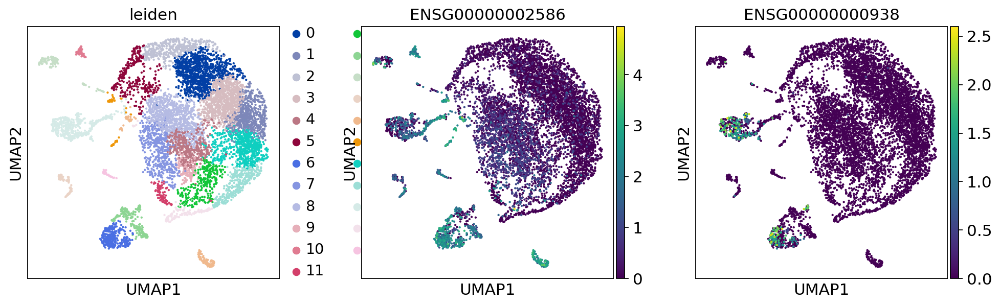

In [13]:
sc.pl.umap(adata, color=["leiden", "ENSG00000002586", "ENSG00000000938"])

In [14]:
adata.write(results_file)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


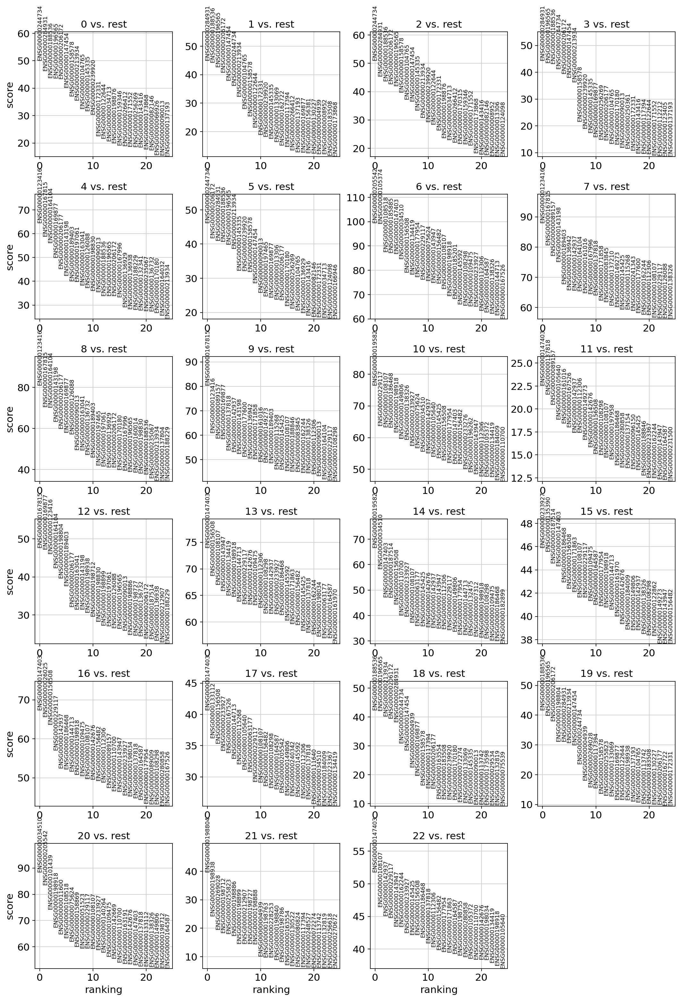

In [15]:
sc.tl.rank_genes_groups(adata, "leiden", method="t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


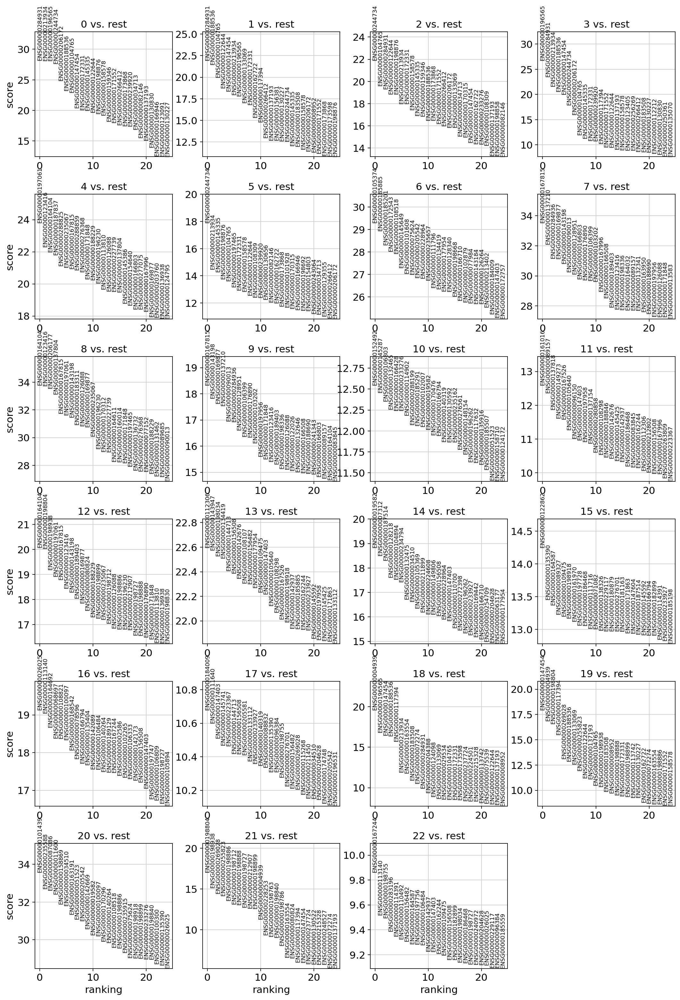

In [16]:
sc.settings.verbostiy = 2

sc.tl.rank_genes_groups(adata, "leiden", method="wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:02:37)


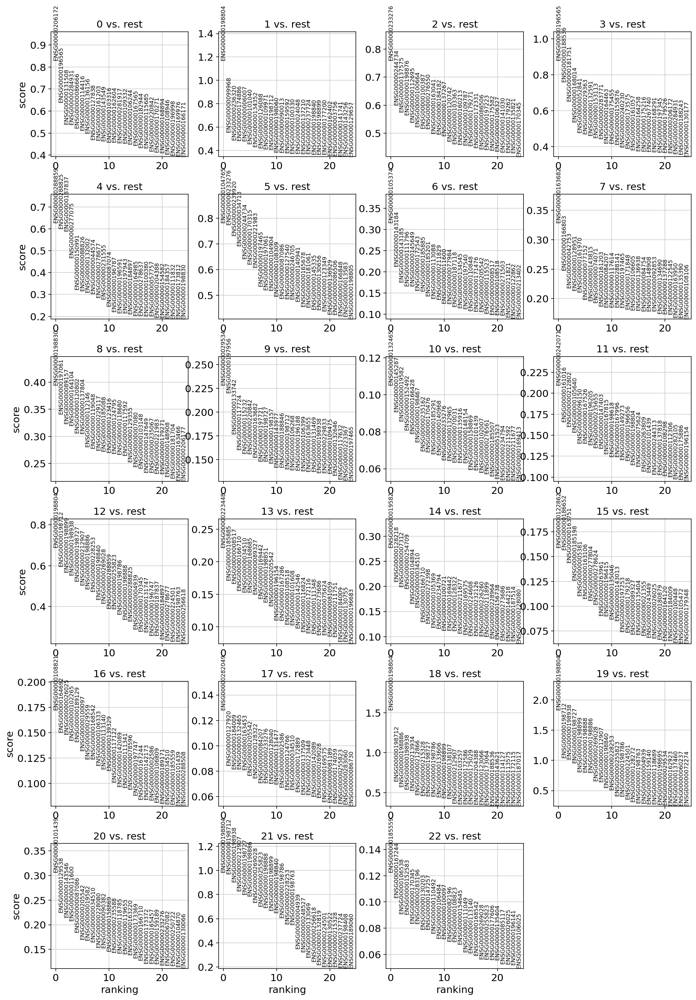

In [17]:
adata.write(results_file)

sc.tl.rank_genes_groups(adata, "leiden", method="logreg", max_iter=1000)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [18]:
adata = sc.read(results_file)

marker_genes = pd.DataFrame(adata.uns["rank_genes_groups"]["names"]).head(2)

marker_genes.to_csv("marker_genes.csv", header=True) # export table to csv file for use in biomart ensembl

In [19]:
result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
pd.DataFrame(
    {
        group + "_" + key[:1]: result[key][group]
        for group in groups
        for key in ["names", "pvals"]
    }
).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,18_n,18_p,19_n,19_p,20_n,20_p,21_n,21_p,22_n,22_p
0,ENSG00000284931,3.574827e-174,ENSG00000284931,1.617148e-106,ENSG00000244734,4.619801e-106,ENSG00000196565,3.088489e-157,ENSG00000197061,3.812052e-125,...,ENSG00000004939,2.028813e-85,ENSG00000147454,5.442578e-72,ENSG00000101439,4.083690e-247,ENSG00000198804,4.807153e-65,ENSG00000167244,6.095776e-23
1,ENSG00000213934,6.930860e-174,ENSG00000188536,3.313435e-102,ENSG00000104765,1.439771e-85,ENSG00000284931,4.852483e-122,ENSG00000123416,4.873709e-110,...,ENSG00000196565,1.977496e-63,ENSG00000004939,8.392765e-64,ENSG00000235588,1.277690e-234,ENSG00000198938,1.207242e-51,ENSG00000113140,1.790649e-21
2,ENSG00000196565,1.622067e-173,ENSG00000104765,1.479890e-88,ENSG00000284931,5.024501e-83,ENSG00000213934,2.032314e-103,ENSG00000164104,4.318599e-107,...,ENSG00000147454,1.187441e-60,ENSG00000198804,1.133772e-61,ENSG00000087086,3.577319e-233,ENSG00000269028,4.470793e-47,ENSG00000198755,2.192403e-21
3,ENSG00000244734,4.966736e-168,ENSG00000122644,3.164502e-78,ENSG00000122644,2.811092e-79,ENSG00000188536,8.408046e-94,ENSG00000187837,2.252692e-105,...,ENSG00000188536,3.491710e-60,ENSG00000117394,5.133008e-54,ENSG00000011600,2.638080e-230,ENSG00000255823,1.813027e-45,ENSG00000283196,6.215189e-21
4,ENSG00000206172,2.473676e-136,ENSG00000147454,3.418346e-75,ENSG00000198876,3.917288e-79,ENSG00000147454,4.292087e-89,ENSG00000288825,4.907169e-99,...,ENSG00000117394,1.213898e-55,ENSG00000269028,2.957938e-39,ENSG00000158869,5.152552e-223,ENSG00000198886,7.754412e-42,ENSG00000114391,8.916437e-21


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


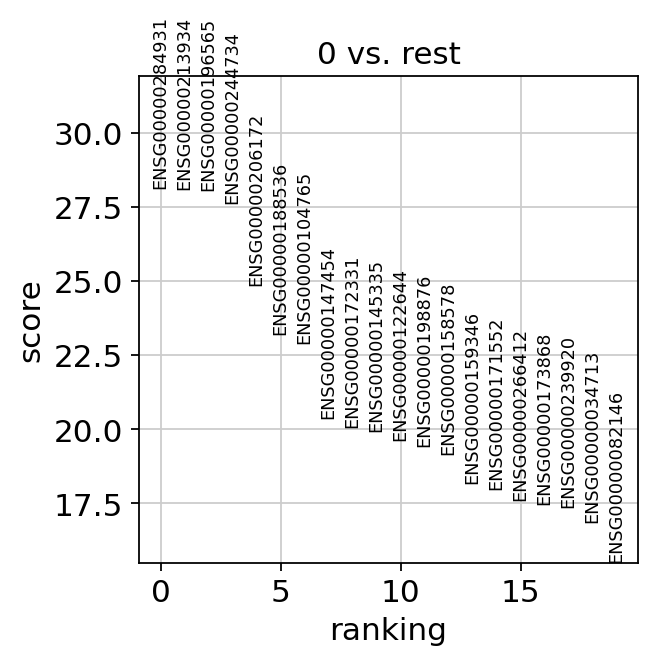

In [20]:
sc.tl.rank_genes_groups(adata, "leiden", groups=["0"], refrence="1", method="wilcoxon")
sc.pl.rank_genes_groups(adata, groups=["0"], n_genes=20)

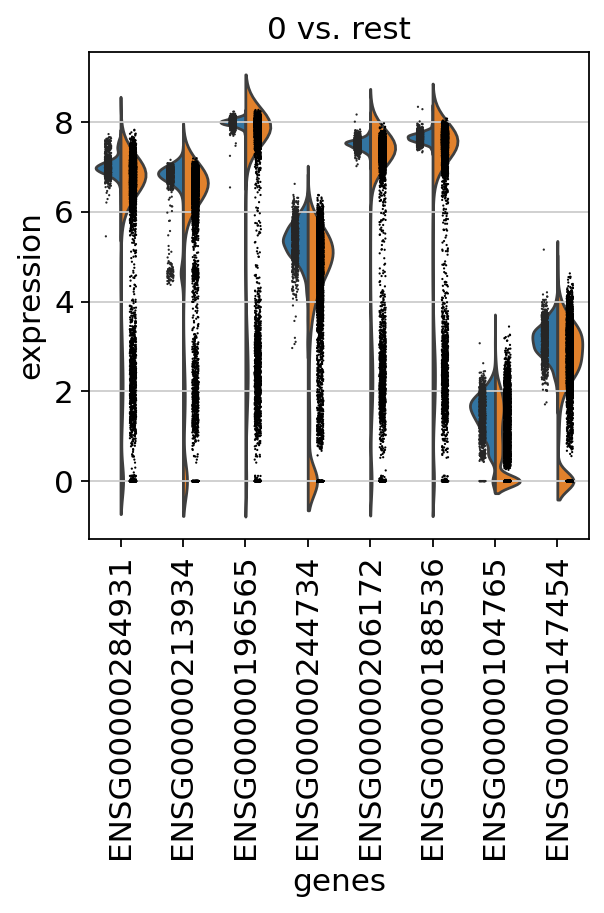

In [21]:
sc.pl.rank_genes_groups_violin(adata, groups="0", n_genes=8)

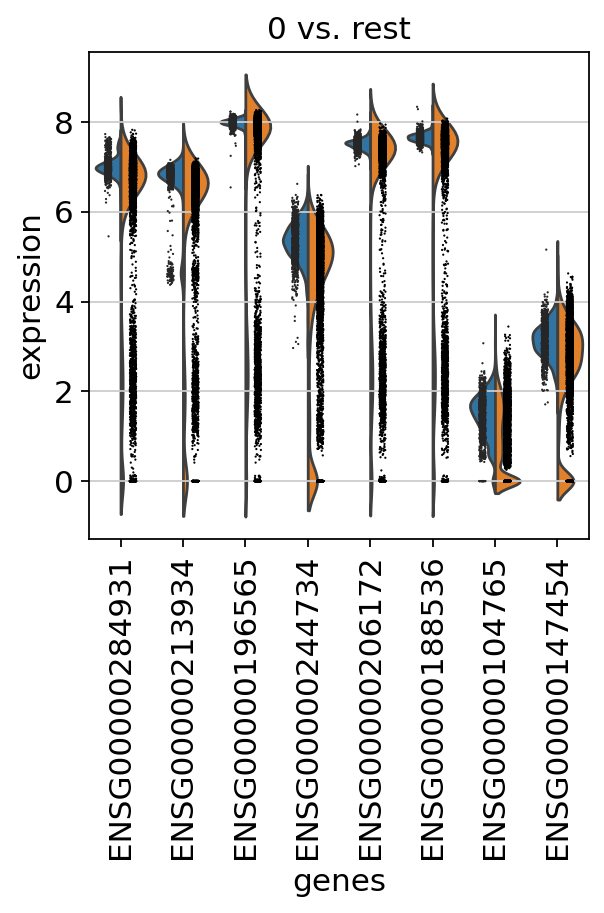

In [22]:
adata = sc.read(results_file)

sc.pl.rank_genes_groups_violin(adata, groups="0", n_genes=8)

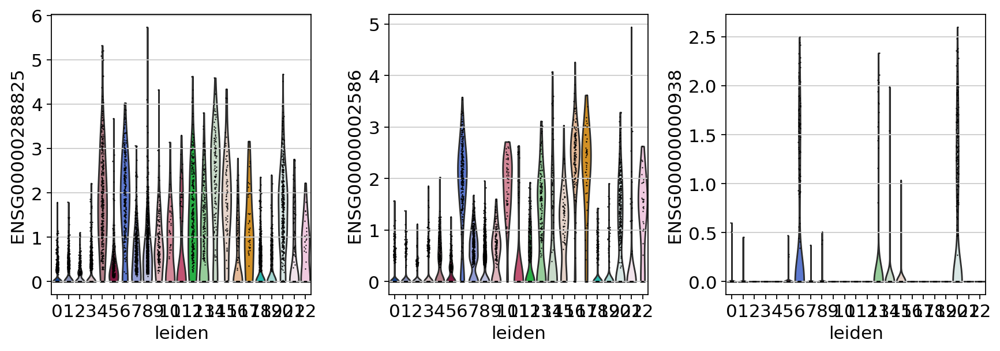

In [23]:
sc.pl.violin(adata, ["ENSG00000288825", "ENSG00000002586", "ENSG00000000938"], groupby="leiden")

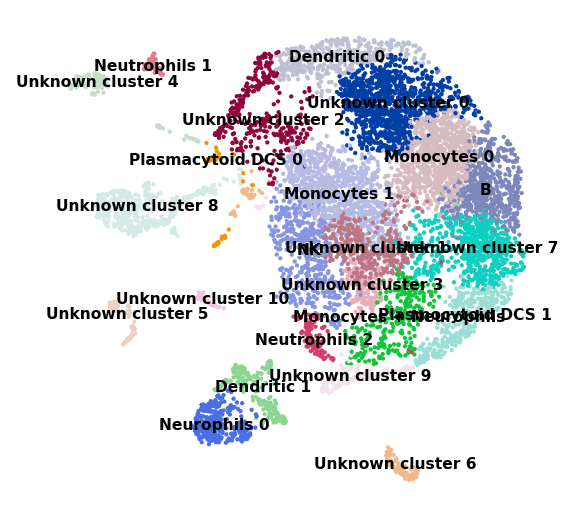

In [24]:
new_cluster_names = [
    "Unknown cluster 0",
    "B",
    "Dendritic 0",
    "Monocytes 0",
    "Unknown cluster 1",
    "Unknown cluster 2",
    "Neurophils 0",
    "NK",
    "Monocytes 1",
    "Unknown cluster 3",
    "Neutrophils 1",
    "Neutrophils 2",
    "Monocytes + Neurophils",
    "Dendritic 1",
    "Unknown cluster 4",
    "Unknown cluster 5",
    "Unknown cluster 6",
    "Plasmacytoid DCS 0",
    "Unknown cluster 7",
    "Plasmocytoid DCS 1",
    "Unknown cluster 8",
    "Unknown cluster 9",
    "Unknown cluster 10",
]
adata.rename_categories("leiden", new_cluster_names)

sc.pl.umap(
    adata, color="leiden", legend_loc="on data", title="", frameon=False, legend_fontsize = 7,
)

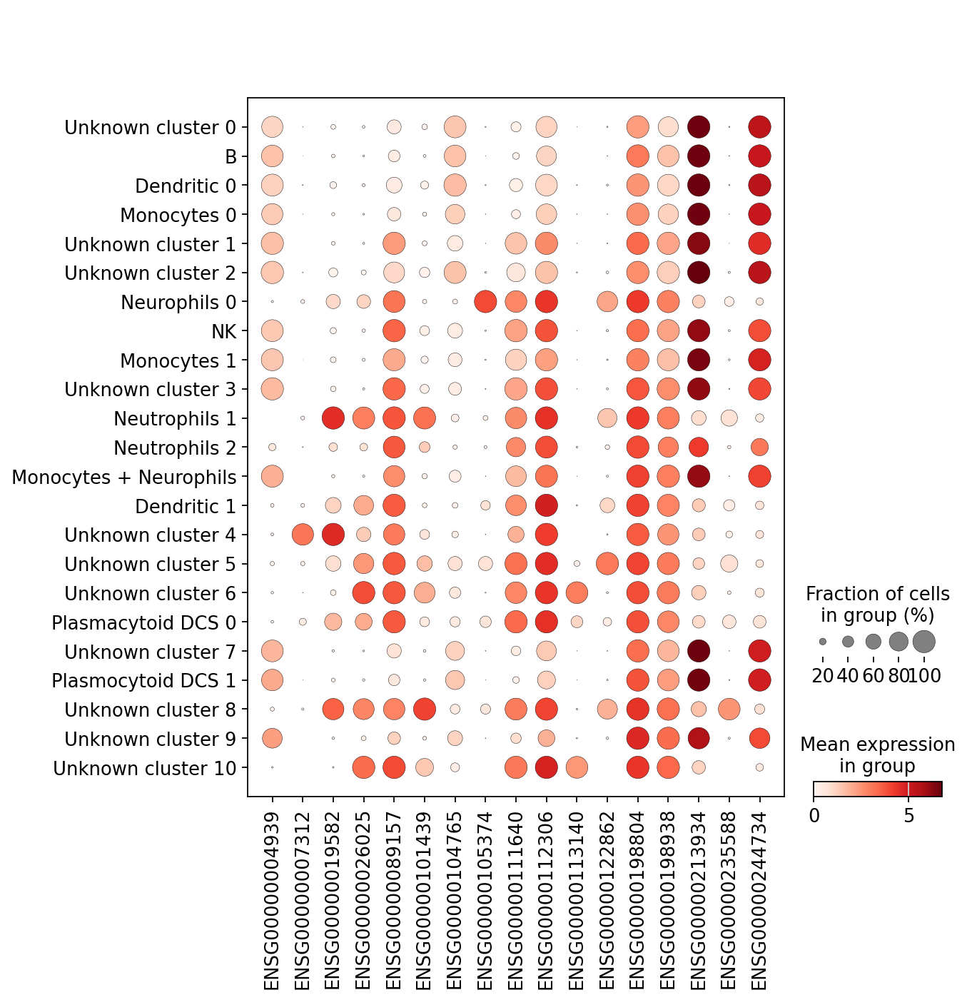

In [25]:
marker_genes = [
    *["ENSG00000004939", "ENSG00000007312", "ENSG00000019582", "ENSG00000026025", "ENSG00000089157", "ENSG00000101439", "ENSG00000104765"],
    *["ENSG00000105374", "ENSG00000111640", "ENSG00000112306", "ENSG00000113140", "ENSG00000122862"],
    *["ENSG00000198804", "ENSG00000198938", "ENSG00000213934", "ENSG00000235588", "ENSG00000244734"],
]

sc.pl.dotplot(adata, marker_genes, groupby="leiden")

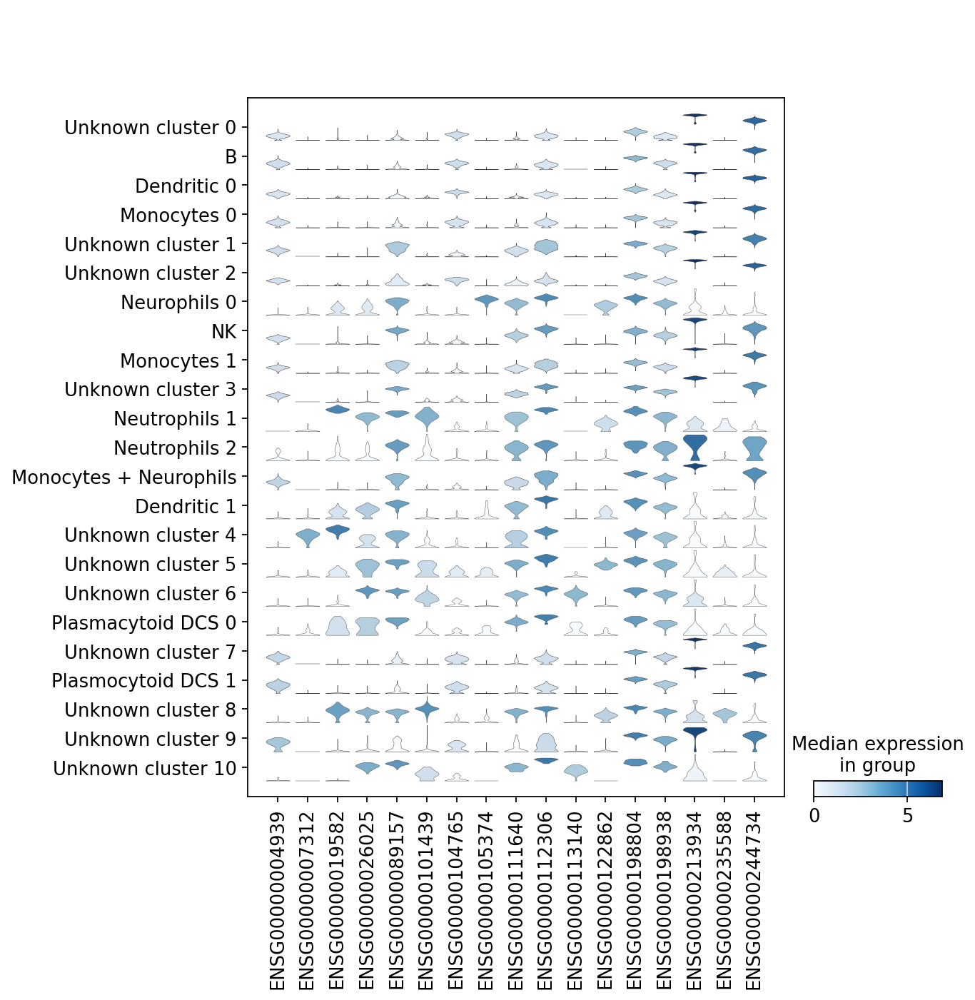

In [26]:
sc.pl.stacked_violin(adata, marker_genes, groupby="leiden");

In [27]:
adata.write(results_file, compression="gzip")

adata.raw.to_adata().write("./write/fetal_blood_original.h5ad")